<a href="https://colab.research.google.com/github/0x384c0/Experiments-MachineLearning/blob/master/colab/Amazon_Fine_Food_Reviews_analysis_and_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 ## Amazon fine-food reviews dataset Clustering and Classification using USE and CLIP
 Base on OpenAI use case https://platform.openai.com/docs/guides/embeddings/use-cases

## Database

In [175]:
#@title Download DB from https://www.kaggle.com/datasets/snap/amazon-fine-food-reviews using link from Browser Dev console
#@markdown * Go to https://www.kaggle.com/datasets/snap/amazon-fine-food-reviews and signin in
#@markdown * Press Download
#@markdown * Cancel Download
#@markdown * Copy download link for file `archive.zip` from chrome://downloads/
#@markdown * Paste download to `db_download_link` param

db_download_link = "PASTE_LINK_HERE" #@param {type:"string"}

if not db_download_link.startswith('https://storage.googleapis.com/kaggle-data-sets/18/2157/bundle/archive.zip'):
  raise Exception("Invalid download link")

!curl '{db_download_link}' \
  -H 'authority: storage.googleapis.com' \
  -H 'accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7' \
  -H 'accept-language: en-US,en;q=0.9,ru;q=0.8' \
  -H 'referer: https://www.kaggle.com/' \
  -H 'sec-ch-ua: "Chromium";v="112", "Google Chrome";v="112", "Not:A-Brand";v="99"' \
  -H 'sec-ch-ua-mobile: ?0' \
  -H 'sec-ch-ua-platform: "macOS"' \
  -H 'sec-fetch-dest: document' \
  -H 'sec-fetch-mode: navigate' \
  -H 'sec-fetch-site: cross-site' \
  -H 'sec-fetch-user: ?1' \
  -H 'upgrade-insecure-requests: 1' \
  -H 'user-agent: Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/112.0.0.0 Safari/537.36' \
  --compressed \
  -o "database.sqlite.zip" -L

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  242M  100  242M    0     0   146M      0  0:00:01  0:00:01 --:--:--  146M


In [176]:
#@title Extract Database
!unzip -o database.sqlite
!ls

Archive:  database.sqlite
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
Archive:  database.sqlite.zip
  inflating: Reviews.csv             
  inflating: database.sqlite         
  inflating: hashes.txt              
database.sqlite  database.sqlite.zip  hashes.txt  Reviews.csv  sample_data


In [177]:
#@title Cleanup
!rm -f database.sqlite.zip hashes.txt  Reviews.csv
!ls

database.sqlite  sample_data


In [178]:
#@title Load Database
import sqlite3
import pandas as pd
from absl import logging

logging.set_verbosity(logging.ERROR)

con = sqlite3.connect("database.sqlite")
df = pd.read_sql_query(""" SELECT Score, Text FROM Reviews LIMIT 10000""", con)
print("Number of data points in our data", df.shape)

Number of data points in our data (10000, 2)


In [179]:
#@title Sample and log database
display(df[:3])

,Score,Text
0,5,I have bought several of the Vitality canned d...
1,1,Product arrived labeled as Jumbo Salted Peanut...
2,4,This is a confection that has been around a fe...


In [180]:
#@title Import common libraries
import numpy as np

## Embeddings with USE (Universal Sentence Encoder)

In [181]:
#@title Load the Universal Sentence Encoder's TF Hub module
import tensorflow_hub as hub

module_url = "https://tfhub.dev/google/universal-sentence-encoder/4" #@param ["https://tfhub.dev/google/universal-sentence-encoder/4", "https://tfhub.dev/google/universal-sentence-encoder-large/5"]
model = hub.load(module_url)

def embed_use(input):
  return model(input)

## Embeddings with CLIP (Contrastive Language-Image Pretraining)

In [182]:
!nvidia-smi

Tue Jun 27 06:25:21 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   72C    P0    30W /  70W |   9291MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [183]:
%%capture
!pip install transformers

In [196]:
#@title: Setup CLIP
import torch
import gc
# from sklearn.preprocessing import normalize
from torch.nn.functional import normalize
from transformers import CLIPTextModel, CLIPTokenizer, CLIPModel, logging

logging.set_verbosity_error()

# variables
batch_size = 1
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

# models
model_id = "openai/clip-vit-base-patch32"
tokenizer = CLIPTokenizer.from_pretrained(model_id)
text_encoder = CLIPTextModel.from_pretrained(model_id)
clip_model = CLIPModel.from_pretrained(model_id)

# free memory
gc.collect()
torch.cuda.empty_cache()

# setup models
text_encoder.to(torch_device)
clip_model.to(torch_device)

def embed_clip(prompt):
  # tokinize prompt
  text_input = tokenizer(
      prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt"
  ).to(torch_device)

  with torch.no_grad():
    text_features = clip_model.get_text_features(**text_input)
    text_embeddings = torch.flatten(text_encoder(text_input.input_ids.to(torch_device))['last_hidden_state'],1,-1)
    text_embeddings = normalize(text_embeddings, dim = 1)

  text_embeddings = text_embeddings.cpu().detach().numpy()
  return text_embeddings

## Vizualization

In [185]:
#@title Compute Embedding

number_of_records = 1000 #@param {type:"integer"}

message_embeddings_use = embed_use(df.Text.values[:number_of_records].tolist())
message_embeddings_clip = embed_clip(df.Text.values[:number_of_records].tolist())

In [186]:
#@title Log embeddings

number_of_records = 3 #@param {type:"integer"}

def embed_and_log(message_embeddings, messages_):
  print("message_embeddings.shape - " + str(message_embeddings.shape))
  for i, message_embedding in enumerate(np.array(message_embeddings).tolist()):
    print("\nMessage: {}".format(messages_[i]))
    print("Embedding size: {}".format(len(message_embedding)))
    message_embedding_snippet = ", ".join((str(x) for x in message_embedding[:3]))
    message_embedding_snippet += " ... "
    message_embedding_snippet += ", ".join((str(x) for x in message_embedding[-3:]))
    print("Embedding: {}".format(message_embedding_snippet))

print("USE")
embed_and_log(message_embeddings_use[:number_of_records], df.Text.values[:number_of_records])
print("\nCLIP")
embed_and_log(message_embeddings_clip[:number_of_records], df.Text.values[:number_of_records])

USE
message_embeddings.shape - (3, 512)

Message: I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.
Embedding size: 512
Embedding: -0.005125232972204685, -0.06557482481002808, 0.011586581356823444 ... 0.06874600797891617, -0.03783443942666054, -0.04538626968860626

Message: Product arrived labeled as Jumbo Salted Peanuts...the peanuts were actually small sized unsalted. Not sure if this was an error or if the vendor intended to represent the product as "Jumbo".
Embedding size: 512
Embedding: -0.032338548451662064, 0.011029821820557117, 0.02632075548171997 ... 0.04787895083427429, -0.06666980683803558, 0.01148967444896698

Message: This is a confection that has been around a few centuries.  It is a light, pillowy citrus gelatin with nuts - in this case Filberts. And it is cut 

In [187]:
%%capture
!pip3 install seaborn

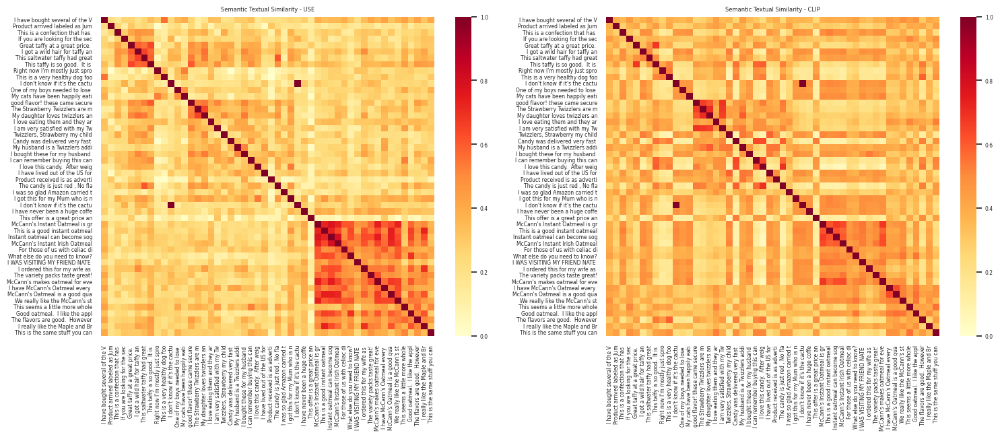

In [188]:
#@title Vizualization Semantic Textual Similarity
#@markdown The embeddings produced by the Universal Sentence Encoder are approximately normalized. The semantic similarity of two sentences can be trivially computed as the inner product of the encodings.

number_of_records = 50 #@param {type:"integer"}

import seaborn as sns


def plot_similarity(features, labels, title):
  rotation = 90
  labels = list(map(lambda s: s[:30], labels))
  corr = np.inner(features, features)
  sns.set(font_scale=0.5)
  heatmap = sns.heatmap(
      corr,
      xticklabels=labels,
      yticklabels=labels,
      vmin=0,
      vmax=1,
      cmap="YlOrRd")
  heatmap.set_xticklabels(labels, rotation=rotation)
  heatmap.set_title(title)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 7))
fig.tight_layout(pad=12)
plt.axes(ax1)
plot_similarity(message_embeddings_use[:number_of_records], df.Text.values[:number_of_records], "Semantic Textual Similarity - USE")
plt.axes(ax2)
plot_similarity(message_embeddings_clip[:number_of_records], df.Text.values[:number_of_records], "Semantic Textual Similarity - CLIP")

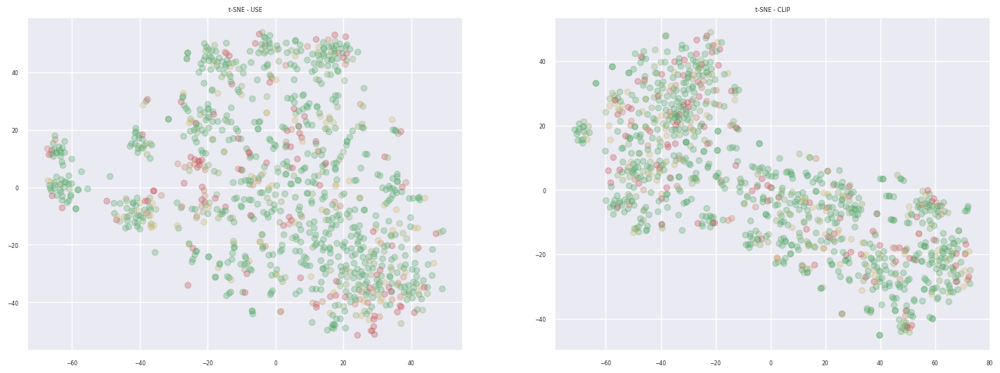

In [189]:
#@title t-SNE vizualization of text embeddings
number_of_records = 1000 #@param {type:"integer"}
learning_rate = 1000 #@param {type:"integer"}

from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
import matplotlib


def embed_and_vizualize_tsne(message_embeddings,scores,title):

  # Create a t-SNE model and transform the data
  tsne = TSNE(n_components=2, perplexity=15, random_state=42, init='random', learning_rate=learning_rate)
  vis_dims = tsne.fit_transform(message_embeddings)

  # Get x and y values
  x = [x for x,y in vis_dims]
  y = [y for x,y in vis_dims]

  # ColorMap for each score
  color_indices = scores - 1
  colormap = matplotlib.colors.LinearSegmentedColormap.from_list('rg', ["r", "y", "g"])

  # Draw
  plt.scatter(x, y, c=color_indices, cmap=colormap, alpha=0.3)
  plt.title(title)


fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16, 7))
fig.tight_layout(pad=12)
plt.axes(ax1)
embed_and_vizualize_tsne(message_embeddings_use[:number_of_records], df.Score.values[:number_of_records],"t-SNE - USE")
plt.axes(ax2)
embed_and_vizualize_tsne(message_embeddings_clip[:number_of_records], df.Score.values[:number_of_records], "t-SNE - CLIP")

In [190]:
#@title Vizualization of text embeddings in tensorboard
number_of_records = 1000 #@param {type:"integer"}

from tensorboard.plugins import projector
import tensorflow as tf
import csv
import os

log_dir='/logs/tensorboard/'
metadata_file = 'metadata.tsv'
checkpoint_file = 'embedding.ckpt'

def save_embeddings(embeddings_):
  weights = tf.Variable(embeddings_)
  checkpoint = tf.train.Checkpoint(embedding=weights)
  checkpoint.save(os.path.join(log_dir, checkpoint_file))

def save_metadata(scores_, messages_):
  with open(os.path.join(log_dir, metadata_file), "w") as f:
    fieldnames = ['Score', 'Label']
    writer = csv.DictWriter(f, delimiter = "\t", fieldnames=fieldnames)
    writer.writeheader()
    for score, label in zip(scores_, messages_):
        writer.writerow({'Score': score, 'Label': label})

def setup_config():
  config = projector.ProjectorConfig()
  embedding = config.embeddings.add()
  embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
  embedding.metadata_path = metadata_file
  projector.visualize_embeddings(log_dir, config)

def embed_and_vizualize(message_embeddings_, messages_, scores_):
  save_embeddings(message_embeddings_)
  save_metadata(scores_, messages_)
  setup_config()


!rm -rf {log_dir}

embed_and_vizualize(message_embeddings_use[:number_of_records], df.Text.values[:number_of_records], df.Score.values[:number_of_records])

In [191]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [192]:
#@title Start tensorboard server
%tensorboard --logdir {log_dir}

Reusing TensorBoard on port 6006 (pid 36645), started 0:06:59 ago. (Use '!kill 36645' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
#@title Download Tensorboard Logs
# uncomment next line to enable
%%script false --no-raise-error

!rm -rf /logs.zip
!zip -r /logs.zip /logs/

from google.colab import files
files.download('/logs.zip')